# 1. Get all validated audio
In the data.tsv file, there is a list of audio files. And we have a lot of audio files in the Dataset/clips folder. Now we want to see, which of the two is redundant.

In [1]:
import os
import pandas as pd

### Get number of labeled audio in the tsv file

In [2]:
df = pd.read_table('Dataset - Copy/data.tsv')
path_list = list(df['path'])
len(path_list)  # 11217

11217

### Get number of voice audio in the "clip" folder

In [3]:
file_list = os.listdir('Dataset - Copy/clips')
len(file_list)  # There used to be 16447 files.

11217

### Union of 2 list 

In [4]:
file_set = set(path_list + file_list)
len(file_set)  # The output used to be 16447, which means every file name in the tsv file is in the "clips" folder

11217

### Delete all unlabeled audio

In [5]:
DATASET_PATH = 'Dataset - Copy/clips/'
for file in file_list:
    if file not in path_list:
        os.remove(DATASET_PATH + file)
# Now, there should only be 11217 files in the "Dataset - Copy/clips/" folder

# 2. Audio feature extraction
In this section, we want to transform all the audio files into features, numbers that the model can understand. There are 2 steps in this section:
- Converting mp3 file to wav file using pydub.AudioSegment (because librosa only support wav file).
- Feature extraction using librosa.

In [1]:
import librosa
import numpy as np
import scipy

from pydub import AudioSegment

### Convert all mp3 files to wav files 

In [11]:
count = 0
for file in file_list:
    src = DATASET_PATH + file
    wav_filename = file.replace('mp3', 'wav')
    dst = 'Wav Dataset/' + wav_filename
    
    sound = AudioSegment.from_mp3(src)
    sound.export(dst, format="wav")
    count += 1
    if count % 500 == 0:
        print(count)

500
1000
1500
2000
2500
3000
3500
4000
4500
5000
5500
6000
6500
7000
7500
8000
8500
9000
9500
10000
10500
11000


### Extract features from wav files 

In [12]:
def audio_feature_extractor(data_folder_name) -> dict:
    
    # Data dictionary with all features
    result = {'file_name': [],
              'rms': [],
              'chroma_stft': [],
              'spec_centroid': [],
              'spec_bandwidth': [],
              'rolloff': [],
              '0_crossing_rate': [],
              'mfcc_0': [],
              'mfcc_1': [],
              'mfcc_2': [],
              'mfcc_3': [],
              'mfcc_4': [],
              'mfcc_5': [],
              'mfcc_6': [],
              'mfcc_7': [],
              'mfcc_8': [],
              'mfcc_9': [],
              'mfcc_10': [],
              'mfcc_11': [],
              'mfcc_12': [],
              'mfcc_13': [],
              'mfcc_14': [],
              'mfcc_15': [],
              'mfcc_16': [],
              'mfcc_17': [],
              'mfcc_18': [],
              'mfcc_19': []              
              }

    count = 0
    for file in os.listdir(data_folder_name):
        count += 1
        if count % 1000 == 0:
            print(count)
        result['file_name'].append(file)
        
        audio_in_time, sampling_rate = librosa.load(data_folder_name + file, sr=None)
        
        rms = librosa.feature.rms(y=audio_in_time)
        result['rms'].append(np.mean(rms))
        chroma_stft = librosa.feature.chroma_stft(y=audio_in_time, sr=sampling_rate)
        result['chroma_stft'].append(np.mean(chroma_stft))
        spec_cent = librosa.feature.spectral_centroid(y=audio_in_time, sr=sampling_rate)
        result['spec_centroid'].append(np.mean(spec_cent))
        spec_bw = librosa.feature.spectral_bandwidth(y=audio_in_time, sr=sampling_rate)
        result['spec_bandwidth'].append(np.mean(spec_bw))
        rolloff = librosa.feature.spectral_rolloff(y=audio_in_time, sr=sampling_rate)
        result['rolloff'].append(np.mean(rolloff))
        zcr = librosa.feature.zero_crossing_rate(audio_in_time)
        result['0_crossing_rate'].append(np.mean(zcr))

        mfcc = librosa.feature.mfcc(y=audio_in_time, sr=sampling_rate)
        for i in range(len(mfcc)):
            result['mfcc_{0}'.format(i)].append(np.mean(mfcc[i]))

    return result   

In [13]:
extracted_data = audio_feature_extractor('Wav Dataset/')

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000


In [14]:
extracted_data_df = pd.DataFrame(extracted_data)
extracted_data_df.head(5)

,file_name,rms,chroma_stft,spec_centroid,spec_bandwidth,rolloff,0_crossing_rate,mfcc_0,mfcc_1,mfcc_2,...,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19
0,common_voice_vi_21824030.wav,0.062319,0.542774,1802.369772,2156.237603,3216.156377,0.046499,-342.825165,144.740005,-12.216655,...,-3.114997,-7.254210,-1.481771,-1.832269,-11.609197,-3.724925,-7.285666,-4.003551,-2.982921,-8.553719
1,common_voice_vi_21824031.wav,0.143010,0.545068,1457.416984,1787.967539,2670.609908,0.034798,-223.974213,207.080948,-25.784807,...,0.274830,-8.947285,-0.622711,-1.406534,-14.936173,-2.186261,-10.668810,-0.520647,-2.298587,-11.188898
2,common_voice_vi_21824032.wav,0.051888,0.550606,1587.076369,2098.246060,2698.152043,0.036947,-381.352631,165.294342,-8.334754,...,-2.424057,-7.780914,-0.925161,-0.683163,-11.206630,-3.615039,-6.792060,-2.147076,-3.946999,-10.071260
3,common_voice_vi_21824033.wav,0.078814,0.541772,1466.343029,1965.838101,2743.344156,0.032437,-304.293762,180.083130,-7.003146,...,-1.681171,-5.439131,0.052298,-3.217829,-11.664877,-0.416567,-7.638383,-2.183744,-2.212888,-9.230699
4,common_voice_vi_21824034.wav,0.041442,0.547660,1706.940186,2233.896873,3004.570799,0.041502,-405.492035,151.433487,-1.741668,...,-3.260194,-6.872738,-1.162172,-0.536909,-10.252456,-4.712666,-6.385332,-2.449236,-3.790674,-8.568843


In [15]:
extracted_data_df.to_csv('Extracted_data.csv', index=False)

In [16]:
label_only_data_df = pd.read_table('Dataset - Copy/data.tsv')
label_only_data_df = label_only_data_df.rename(columns={'path': 'file_name'})
label_only_data_df.replace({'.mp3': '.wav'}, regex=True, inplace=True)
label_only_data_df

,file_name,gender
0,common_voice_vi_23745304.wav,male
1,common_voice_vi_23847390.wav,male
2,common_voice_vi_23847774.wav,male
3,common_voice_vi_23848856.wav,male
4,common_voice_vi_23848864.wav,male
...,...,...
11212,common_voice_vi_24754048.wav,male
11213,common_voice_vi_24770262.wav,male
11214,common_voice_vi_24777439.wav,male
11215,common_voice_vi_24777454.wav,male


In [17]:
labeled_data_df = pd.merge(extracted_data_df, label_only_data_df)
labeled_data_df.to_csv('Labeled_data.csv', index=False)

# 3. Prepare train, test sets
In this step, since we have the numerical data for each audio file, let's shuffle them up and make a train set and a test set:
- The train set includes male and female samples, 2500 each, 5000 samples in total.
- The test set includes the rest of the data. (459 female samples and 5758 male samples)

In [46]:
import pandas as pd

In [47]:
data_df = pd.read_csv('Labeled_data.csv')
data_df

,file_name,rms,chroma_stft,spec_centroid,spec_bandwidth,rolloff,0_crossing_rate,mfcc_0,mfcc_1,mfcc_2,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,gender
0,common_voice_vi_21824030.wav,0.062319,0.542774,1802.369772,2156.237603,3216.156377,0.046499,-342.82516,144.740000,-12.216655,...,-7.254209,-1.481771,-1.832269,-11.609197,-3.724925,-7.285666,-4.003551,-2.982921,-8.553719,male
1,common_voice_vi_21824031.wav,0.143010,0.545068,1457.416984,1787.967539,2670.609908,0.034798,-223.97421,207.080950,-25.784807,...,-8.947285,-0.622711,-1.406534,-14.936173,-2.186261,-10.668810,-0.520647,-2.298587,-11.188898,male
2,common_voice_vi_21824032.wav,0.051888,0.550606,1587.076369,2098.246060,2698.152043,0.036947,-381.35263,165.294340,-8.334754,...,-7.780914,-0.925161,-0.683163,-11.206630,-3.615039,-6.792060,-2.147076,-3.946999,-10.071260,male
3,common_voice_vi_21824033.wav,0.078814,0.541772,1466.343029,1965.838101,2743.344156,0.032437,-304.29376,180.083130,-7.003146,...,-5.439131,0.052298,-3.217829,-11.664877,-0.416567,-7.638383,-2.183744,-2.212888,-9.230699,male
4,common_voice_vi_21824034.wav,0.041442,0.547660,1706.940186,2233.896873,3004.570799,0.041502,-405.49203,151.433490,-1.741668,...,-6.872738,-1.162172,-0.536909,-10.252456,-4.712666,-6.385332,-2.449236,-3.790674,-8.568843,male
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11212,common_voice_vi_36461194.wav,0.038685,0.428503,1593.490581,2102.488298,2766.612787,0.053094,-420.30650,130.308790,32.236027,...,-0.167556,-0.288612,-6.184428,1.744042,-3.022806,-0.409506,-0.151848,3.617531,-4.409597,male
11213,common_voice_vi_36461195.wav,0.014521,0.489983,1371.530302,2300.820606,2421.875000,0.026677,-539.35785,117.491710,34.518288,...,4.009381,1.954496,-2.482402,2.207606,-5.513907,-2.892970,-0.881376,-0.979780,-0.936119,male
11214,common_voice_vi_36461196.wav,0.025583,0.430667,1330.476107,1782.497757,2171.875000,0.045944,-455.21387,153.754530,13.486879,...,-0.924297,1.084395,-3.050448,3.559938,-3.021488,-2.465002,-1.429341,-2.614654,-5.628028,male
11215,common_voice_vi_36461197.wav,0.022876,0.464833,1590.406475,2279.664099,3029.029605,0.038417,-493.65616,124.586330,35.689808,...,-1.145756,4.831850,-8.192791,-1.043981,-2.607037,1.088539,-2.267666,-0.351874,-0.529309,male


In [48]:
male_df = data_df[data_df['gender'] == 'male'].sample(frac=1, random_state=123)
female_df = data_df[data_df['gender'] == 'female'].sample(frac=1, random_state=123)

# 2959 - 8258

In [49]:
# Train set: 2500 female, 2500 male --> 5000 samples
# Test set: 459 female, 5758 male --> 6217 samples
train_male_df, test_male_df = male_df.head(2500), male_df.tail(5758)
train_female_df, test_female_df = female_df.head(2500), female_df.tail(459)

In [50]:
train_df = pd.concat([train_male_df, train_female_df], axis=0)
test_df = pd.concat([test_male_df, test_female_df], axis=0)

In [52]:
train_df.to_csv('Trainable Data/train.csv', index=False)
test_df.to_csv('Trainable Data/test.csv', index=False)

# 4. Plot out data distribution
It's good practice to check if the distribution of the train and test set is similar to each other to make sure our model doesn't miss out a lot of data.

In [53]:
import seaborn as sns
import pandas as pd
import numpy as np

In [54]:
train_df = pd.read_csv('Trainable Data/train.csv', index_col=False)
test_df = pd.read_csv('Trainable Data/test.csv', index_col=False)

In [55]:
male_train_df = train_df[train_df['gender'] == 'male'].drop(columns=['file_name', 'gender'])
male_test_df = test_df[test_df['gender'] == 'male'].drop(columns=['file_name', 'gender'])
female_train_df = train_df[train_df['gender'] == 'female'].drop(columns=['file_name', 'gender'])
female_test_df = test_df[test_df['gender'] == 'female'].drop(columns=['file_name', 'gender'])

In [56]:
male_train_df['dataset'] = 'train'
female_train_df['dataset'] = 'train'
male_test_df['dataset'] = 'test'
female_test_df['dataset'] = 'test'

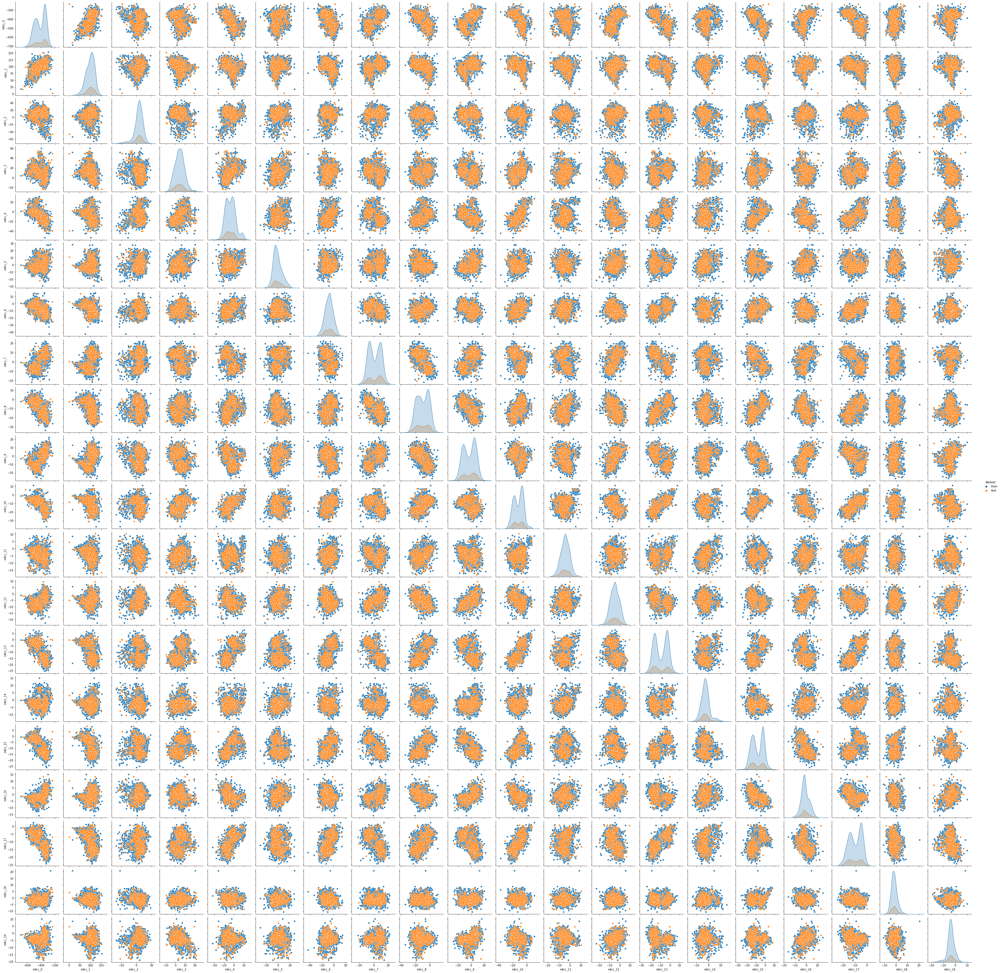

In [64]:
%matplotlib inline

columns = ['rms', 'chroma_stft', 'spec_centroid', 'spec_bandwidth', 'rolloff', '0_crossing_rate', 'dataset']
plot_df = pd.concat([female_train_df.iloc[:, -21:], female_test_df.iloc[:, -21:]], axis=0, ignore_index=True)
plot_df
sns_plot = sns.pairplot(plot_df, hue='dataset', height=2.5)

# 5. Using GridSearchCV to find the most appropriate model
Now we've finished with the dataset, let's try to find the most appropriate model for this task using GridSearchCV.
All the results can be found in the "GSCV_Results" folder.

In [7]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix
from sklearn.linear_model import LogisticRegression

import numpy as np
import pandas as pd

In [8]:
np.random.seed(123)

In [13]:
steps = [('scaler', StandardScaler()),
         ('model', MLPClassifier(
             activation='relu', hidden_layer_sizes=(20, 10, 5),
             max_iter=10000, early_stopping=True))]
pipeline = Pipeline(steps)

In [10]:
train_df = pd.read_csv('Trainable Data/train.csv')
shuffled_train_df = train_df.sample(frac=1, random_state=123)

X_data = shuffled_train_df.drop(columns=['file_name', 'gender'])
y_data = shuffled_train_df['gender']

In [11]:
params_dict = {'model__hidden_layer_sizes': [20, 15, 10,
                                             (20, 15), (20, 10), (15, 10),
                                             (20, 15, 10), (20, 10, 5), (15, 10, 5),
                                             (20, 15, 7, 3), (15, 10, 5, 3)],
               'model__activation': ['logistic', 'tanh', 'relu']}


grid = GridSearchCV(estimator=pipeline,
                    param_grid=params_dict,
                    scoring='accuracy',
                    refit='accuracy',
                    verbose=10, cv=5, n_jobs=5)
grid.fit(X_data, y_data)

csv_grid = pd.DataFrame(grid.cv_results_)
csv_grid.to_csv('GSCV_Results/NN.csv')

Fitting 5 folds for each of 33 candidates, totalling 165 fits


# 6. Our model

In [13]:
steps = [('scaler', StandardScaler()),
         ('model', MLPClassifier(
             activation='relu', hidden_layer_sizes=(20, 10, 5),
             max_iter=10000, early_stopping=True))]
pipeline = Pipeline(steps)

In [14]:
model = pipeline.fit(X=X_data, y=y_data)

test_df = pd.read_csv('Trainable Data/test.csv')

X_test = test_df.drop(columns=['file_name', 'gender'])
y_test = test_df['gender']

In [15]:
y_pred = model.predict(X=X_test)
print(model.predict_proba(X_test))
print(model.score(X_test, y_test))
print(confusion_matrix(y_test, y_pred))
precision_recall_fscore_support(y_test, y_pred)

[[9.53563534e-04 9.99046436e-01]
 [8.37625408e-03 9.91623746e-01]
 [2.36672132e-02 9.76332787e-01]
 ...
 [8.39497120e-03 9.91605029e-01]
 [9.85631050e-01 1.43689505e-02]
 [9.96691140e-01 3.30886002e-03]]
0.9642914589030079
[[ 448   11]
 [ 211 5547]]


(array([0.67981791, 0.99802087]),
 array([0.97603486, 0.96335533]),
 array([0.80143113, 0.98038176]),
 array([ 459, 5758], dtype=int64))

# Prediction Explaination using SHAP values 

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix

import numpy as np
import pandas as pd
import shap

In [3]:
np.random.seed(123)

In [4]:
steps = [('scaler', StandardScaler()),
         ('model', MLPClassifier(
             activation='relu', hidden_layer_sizes=(20, 10, 5),
             max_iter=10000, early_stopping=True))]
pipeline = Pipeline(steps)

In [5]:
train_df = pd.read_csv('Trainable Data/train.csv')
shuffled_train_df = train_df.sample(frac=1, random_state=123)

X_data = shuffled_train_df.drop(columns=['file_name', 'gender'])
y_data = shuffled_train_df['gender']

In [6]:
model = pipeline.fit(X=X_data, y=y_data)

test_df = pd.read_csv('Trainable Data/test.csv')

X_test = test_df.drop(columns=['file_name', 'gender'])
y_test = test_df['gender']

In [20]:
y_pred = model.predict(X=X_test)
print(model.predict(X_test))
print(model.score(X_test, y_test))
print(confusion_matrix(y_test, y_pred))
precision_recall_fscore_support(y_test, y_pred) # 97.65%

['male' 'male' 'male' ... 'male' 'female' 'female']
0.97651600450378
[[ 449   10]
 [ 136 5622]]


(array([0.76752137, 0.99822443]),
 array([0.97821351, 0.97638069]),
 array([0.86015326, 0.98718174]),
 array([ 459, 5758], dtype=int64))

In [ ]:
explainer = shap.KernelExplainer(model.predict_proba, shap.sample(X_data, 1000))
shap_values = explainer.shap_values(X_test, nsamples=1000)

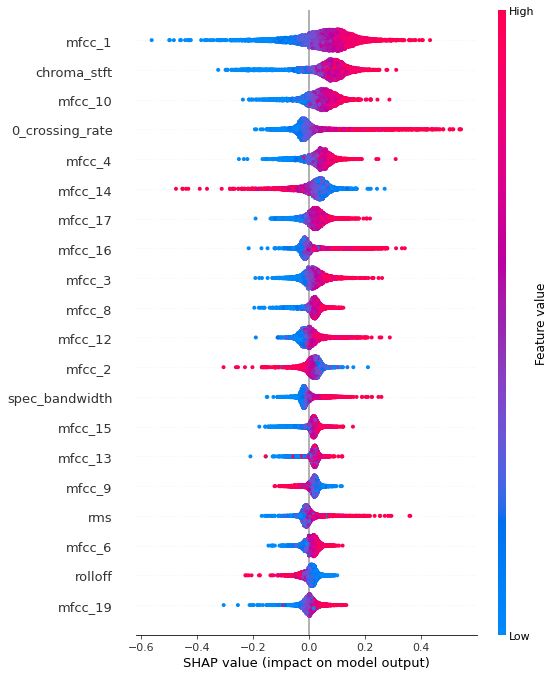

In [30]:
features = X_data.columns
shap.summary_plot(shap_values[1], X_test, feature_names=features)

In [11]:
import librosa
import numpy as np
import scipy
import os

from pydub import AudioSegment
from collections import Counter

In [6]:
file_list = os.listdir('Wav Dataset/') 

In [9]:
sampling_rates = []
count = 0
for file in file_list:
    count += 1
    if count % 1000 == 0:
        print(count)
    audio_in_time, sampling_rate = librosa.load('Wav dataset/' + file, sr=None)
    sampling_rates.append(sampling_rate)

print(max(sampling_rates), min(sampling_rates))

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
48000 32000


In [12]:
print(Counter(sampling_rates))

Counter({32000: 10109, 48000: 1098, 44100: 10})
